In [1]:
import pandas as pd
import numpy as np
import os, glob
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

In [2]:
df = pd.read_csv('spectra_balanced.csv', index_col=0)
display(df.shape)
#df.tail(12)

(360, 1870)

## Functions

In [70]:
# Function to calculate difference from global mean
def calc_globaldif(dfin):
    # fill in NaN's in the spectra
    dfin = fillin(dfin)
    
    # create df with same dims, cols and indexes
    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)

    for i in range(len(dfin.index)):        
        dfout.iloc[i,:] = dfin.iloc[i,:] - dfin.iloc[i,:].mean()
    
    dfout = dfout.astype(float)
    return dfout


# Function to calculate difference from local average
def calc_localdif(dfin, n=10):    
    # fill in NaN's in the spectra
    dfin = fillin(dfin)
    
    rows = dfin.shape[0]
    cols = dfin.shape[1]
    
    # create df with same dims, cols and indexes
    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)

    for i in range(rows):
        for j in range(n, cols-n):
            dfout.iloc[i,j] = dfin.iloc[i,j] - dfin.iloc[i,j-n:j+n].mean()
        print(i)
    
    dfout = dfout.astype(float)
    return dfout


# Function to calculate angles for line
def calc_angles(dfin, n=10):
    
    # fill in NaN's in the spectra
    dfin = fillin(dfin)
    
    rows = dfin.shape[0]
    cols = dfin.shape[1]
    dx = -n * 0.2    # approximation for delta x (acts like a scale factor)

    # create df with same dims, cols and indexes
    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)

    for i in range(rows):
        for j in range(n, cols-n):
            dy = dfin.iloc[i,j-n] - dfin.iloc[i,j+n]
            dfout.iloc[i,j] = np.arctan(dy/dx) * 180/np.pi
    
    dfout = dfout.astype(float)
    return dfout


# Function to fill in NAN values in the Spectra using linear interpolation
def fillin(dfin):
    # fill in NaN's in the middle - use linear interpolation
    dfin.interpolate(method="linear", axis=1, inplace=True) 
    return dfin


# Function to standardize df row values
# standardization: subtract the mean value and divide with std
# output will be the distance from mean in std units
def standardize(dfin):
    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)
    
    for i in range(len(dfin.index)):        
        dfout.iloc[i,:] = (dfin.iloc[i,:] - dfin.iloc[i,:].mean()) / dfin.iloc[i,:].std()
            
    dfout = dfout.astype(float)
    return dfout


# Function to normilize df row values
# using min max values output will be rescaled to 0...1
def normilize(dfin):
    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)
    
    for i in range(len(dfin.index)):        
        dfout.iloc[i,:] = (dfin.iloc[i,:] - dfin.iloc[i,:].min()) / (dfin.iloc[i,:].max() - dfin.iloc[i,:].min())
            
    dfout = dfout.astype(float)
    return dfout
    

# Function to calculate ruggedness
#def calc_ruggedness(dfin, n=8):
#    rows = dfin.shape[0]
#    cols = dfin.shape[1]
#    dfout = pd.DataFrame(index = dfin.index, columns = dfin.columns)
#    
#    for i in range(rows):
#        for j in range(n, cols-n):
#            dfout.loc[dfin.index[i]][j] = dfin.loc[dfin.index[i]][j-n:j+n] - dfin.loc[dfin.index[i]][j]
#    return dfout

## Random sampling data

In [3]:
# subsetting orig dataframe for trying the function
# select random nnumber of samples from each of the following categories:
#Category count
# 1.11    52   silk
# 3.5     44   polyacrylic
# 1.5     44   cotton
# 1.6     40   linen
# 2.1     35   viscose
# 3.1     33   polyester
# 1.1     30   wool
# 1.9     24   jute
# 3.11    22   elastane
# 3.2     18   polyamide
# 2.3     16   acetate
# 3.12    15   polyetylene

# number of random samples to choose:
labels = ['1.11', '3.5', '1.5', '1.6', '2.1', '3.1', '1.1', '1.9', '3.11', '3.2', '2.3', '3.12']
colors = ['black', 'darkgray', 'sienna', 'red', 'gold', 'chartreuse', 'g', 'deepskyblue', 
          'b', 'm', 'palevioletred', 'aqua']
r = 3
 
df1 = df[df['label'] == 1.1].sample(r)
df2 = df[df['label'] == 3.5].sample(r)
df3 = df[df['label'] == 1.5].sample(r)
df4 = df[df['label'] == 1.6].sample(r)
df5 = df[df['label'] == 2.1].sample(r)
df6 = df[df['label'] == 3.1].sample(r)
df7 = df[df['label'] == 1.11].sample(r)
df8 = df[df['label'] == 1.9].sample(r)
df9 = df[df['label'] == 3.11].sample(r)
df10 = df[df['label'] == 3.2].sample(r)
df11 = df[df['label'] == 2.3].sample(r)
df12 = df[df['label'] == 3.12].sample(r)

dfr = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12])
dfr.set_index('label', drop=True, inplace=True)
#dfr

In [136]:
# Legend
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='black', lw=2),
                Line2D([0], [0], color='darkgray', lw=2),
                Line2D([0], [0], color='sienna', lw=2),
                Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='gold', lw=2),
               Line2D([0], [0], color='chartreuse', lw=2),
               Line2D([0], [0], color='g', lw=2),
               Line2D([0], [0], color='deepskyblue', lw=2),
               Line2D([0], [0], color='b', lw=2),
               Line2D([0], [0], color='m', lw=2),
               Line2D([0], [0], color='palevioletred', lw=2),
               Line2D([0], [0], color='aqua', lw=2),]

labels = ['1.11', '3.5', '1.5', '1.6', '2.1', '3.1', '1.1', '1.9', '3.11', '3.2', '2.3', '3.12']

## Feature exploration

### Calc features

In [4]:
%%time
#dfr_glo = calc_globaldif(dfr)
#dfr_loc = calc_localdif(dfr, 40)
#dfr_ang = calc_angles(dfr, 50)

Wall time: 0 ns


### Original data

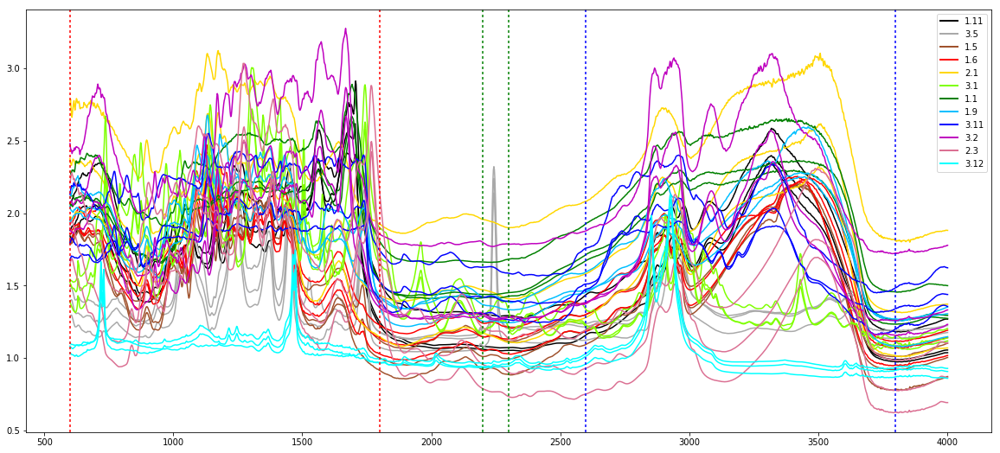

In [137]:
# dfr.T.plot(figsize=(20,9), legend=False)


fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr.columns.astype(float), dfr.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)


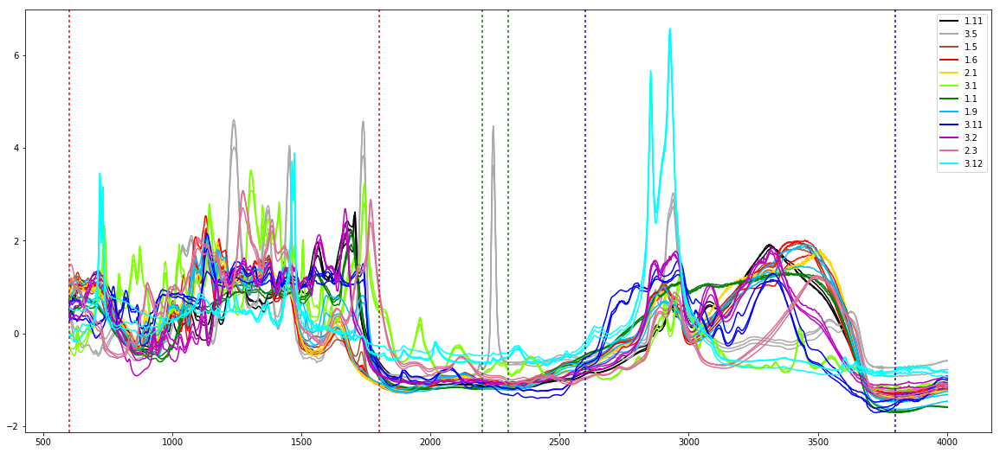

In [138]:
dfr_s = standardize(dfr)
fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_s.columns.astype(float), dfr_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

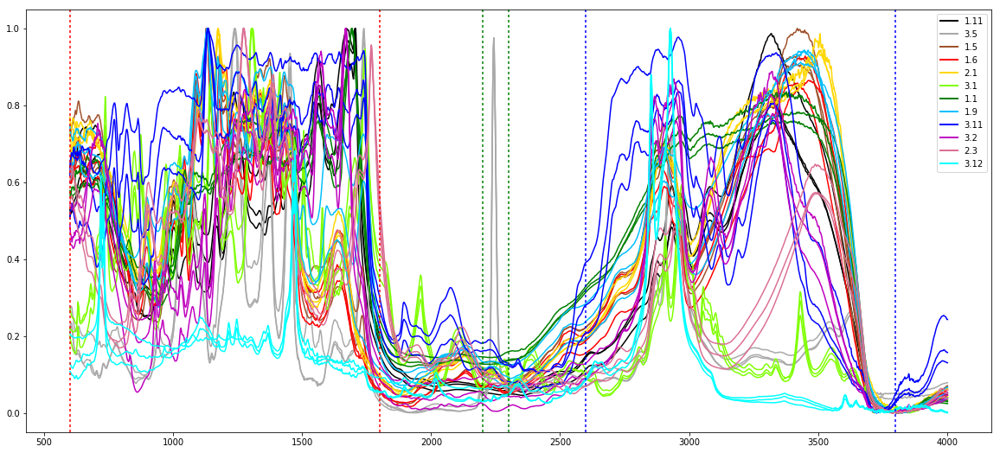

In [139]:
dfr_n = normilize(dfr)
fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_n.columns.astype(float), dfr_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

### Global diff

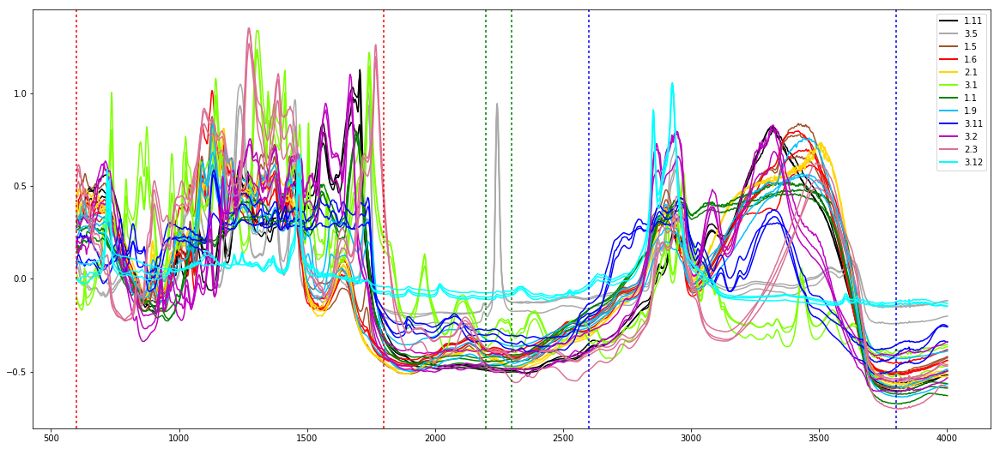

In [140]:
#dfr_glo.T.plot(figsize=(20,9), legend=False)

fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_glo.columns.astype(float), dfr_glo.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

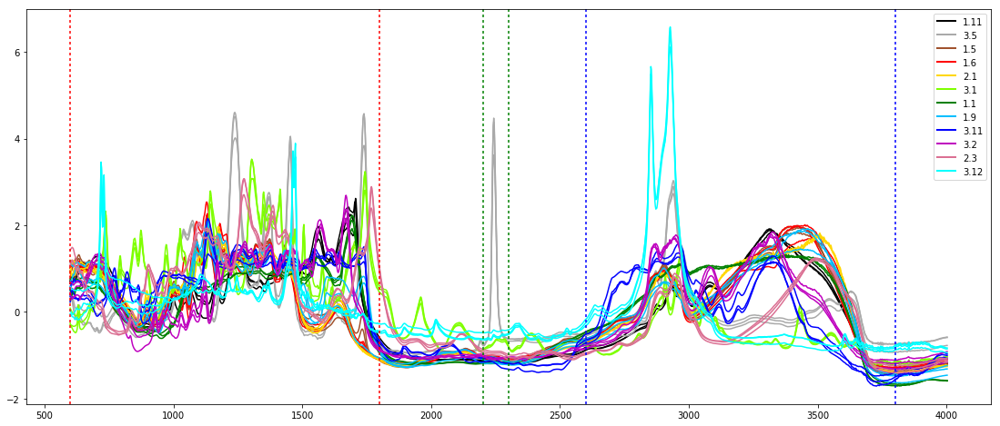

In [141]:
dfr_glo_s = standardize(dfr_glo)

fig = plt.figure(figsize=[19, 8])
for i in range(len(labels)):
    plt.plot(dfr_glo_s.columns.astype(float), dfr_glo_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

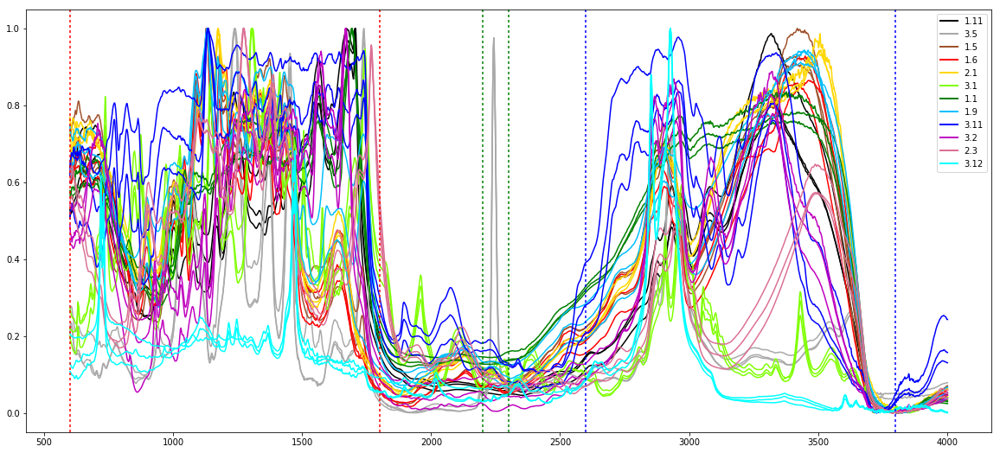

In [142]:
dfr_glo_n = normilize(dfr_glo)

fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_glo_n.columns.astype(float), dfr_glo_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

### Local dif

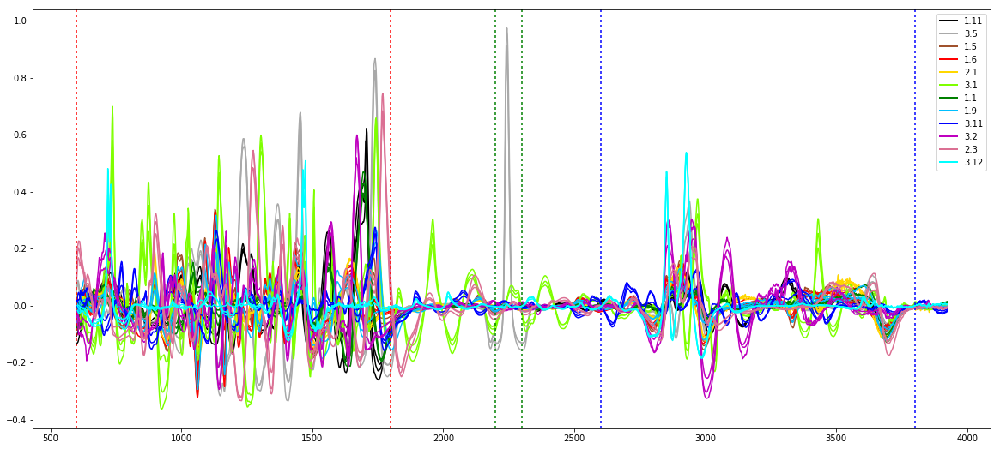

In [143]:
#dfr_loc.T.plot(figsize=(20,9), legend=False)

fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_loc.columns.astype(float), dfr_loc.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

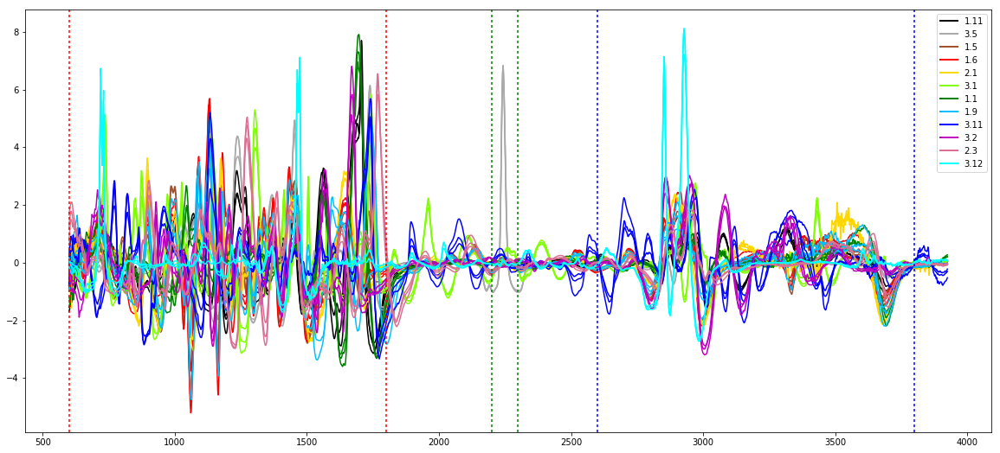

In [144]:
dfr_loc_s = standardize(dfr_loc)

fig = plt.figure(figsize=[20,9])
for i in range(len(labels)):
    plt.plot(dfr_loc_s.columns.astype(float), dfr_loc_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

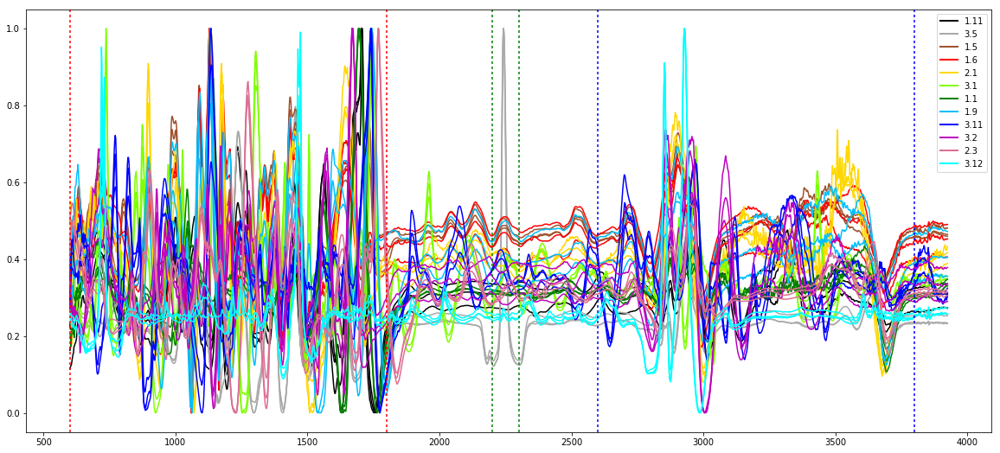

In [145]:
dfr_loc_n = normilize(dfr_loc)

fig = plt.figure(figsize=[20,9])
for i in range(len(labels)):
    plt.plot(dfr_loc_n.columns.astype(float), dfr_loc_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

### Slope / angle

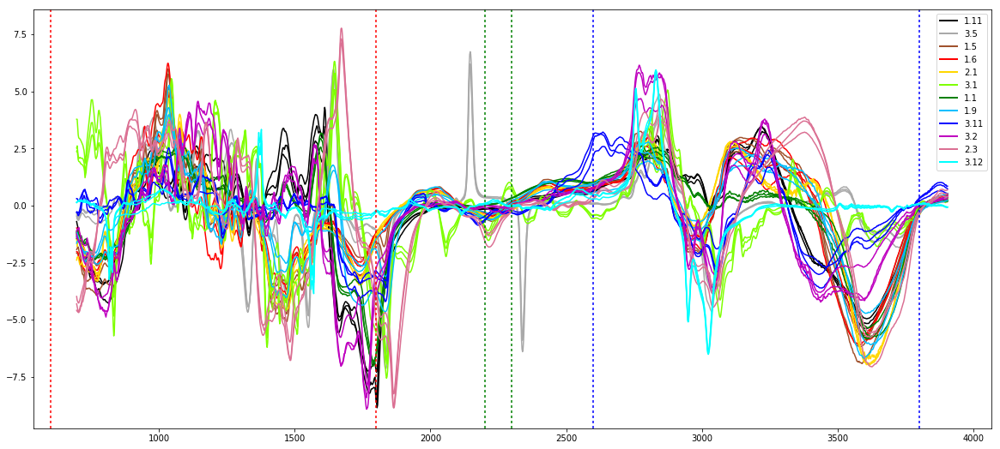

In [146]:
#dfr_ang.T.plot(figsize=(20,9), legend=False)

fig = plt.figure(figsize=[20, 9])
for i in range(len(labels)):
    plt.plot(dfr_ang.columns.astype(float), dfr_ang.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

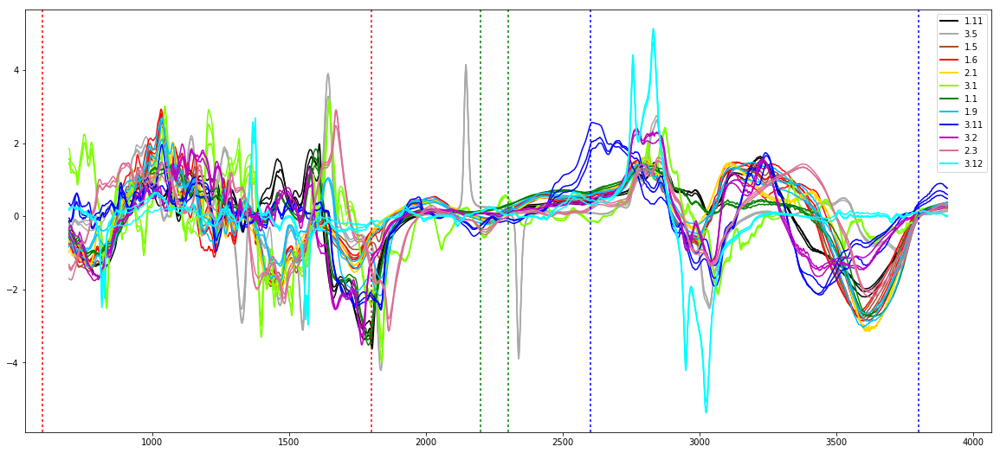

In [147]:
dfr_ang_s = standardize(dfr_ang)

fig = plt.figure(figsize=[20,9])
for i in range(len(labels)):
    plt.plot(dfr_ang_s.columns.astype(float), dfr_ang_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

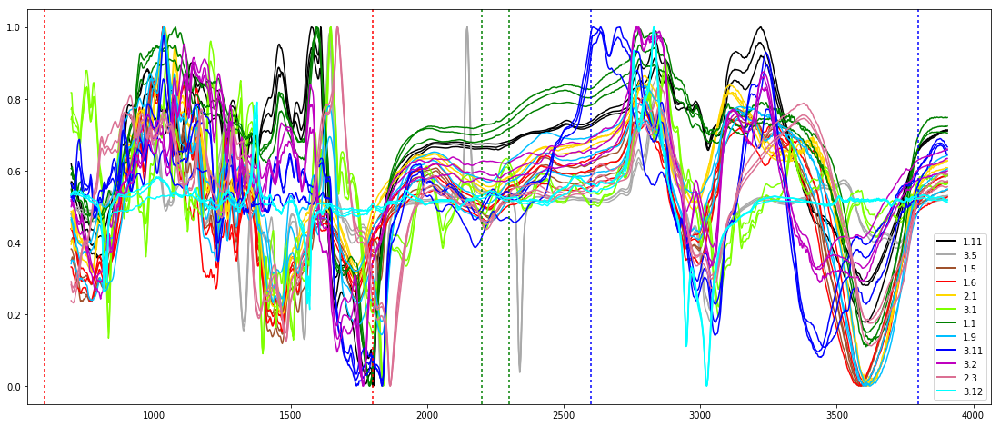

In [148]:
dfr_ang_n = normilize(dfr_ang)

fig = plt.figure(figsize=[19, 8])
for i in range(len(labels)):
    plt.plot(dfr_ang_n.columns.astype(float), dfr_ang_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

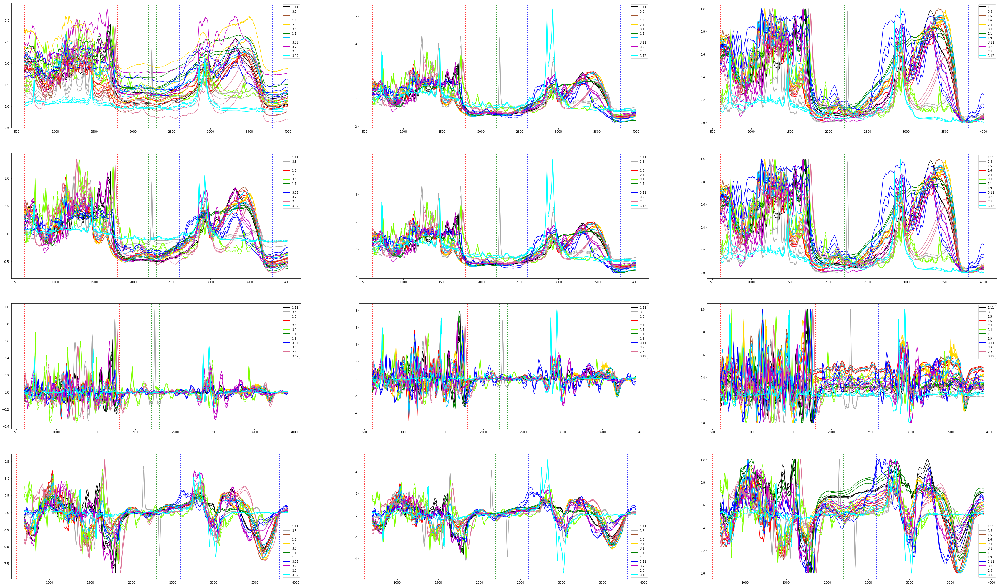

In [157]:
fig = plt.figure(figsize=[60, 36])

plt.subplot(431)
for i in range(len(labels)):
    plt.plot(dfr.columns.astype(float), dfr.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(432)
for i in range(len(labels)):
    plt.plot(dfr_s.columns.astype(float), dfr_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(433)
for i in range(len(labels)):
    plt.plot(dfr_n.columns.astype(float), dfr_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(434)
for i in range(len(labels)):
    plt.plot(dfr_glo.columns.astype(float), dfr_glo.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)


plt.subplot(435)
for i in range(len(labels)):
    plt.plot(dfr_glo_s.columns.astype(float), dfr_glo_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(436)
for i in range(len(labels)):
    plt.plot(dfr_glo_n.columns.astype(float), dfr_glo_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(437)
for i in range(len(labels)):
    plt.plot(dfr_loc.columns.astype(float), dfr_loc.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)


plt.subplot(438)
for i in range(len(labels)):
    plt.plot(dfr_loc_s.columns.astype(float), dfr_loc_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(439)
for i in range(len(labels)):
    plt.plot(dfr_loc_n.columns.astype(float), dfr_loc_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

# ANGLE
plt.subplot(4,3,10)
for i in range(len(labels)):
    plt.plot(dfr_ang.columns.astype(float), dfr_ang.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)

plt.subplot(4,3,11)
for i in range(len(labels)):
    plt.plot(dfr_ang_s.columns.astype(float), dfr_ang_s.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)


plt.subplot(4,3,12)
for i in range(len(labels)):
    plt.plot(dfr_ang_n.columns.astype(float), dfr_ang_n.loc[float(labels[i])].T, color=colors[i])
plt.axvline(x=600, color='red', dashes=(2,2))
plt.axvline(x=1800, color='red', dashes=(2,2))
plt.axvline(x=2200, color='green', dashes=(2,2))
plt.axvline(x=2300, color='green', dashes=(2,2))
plt.axvline(x=2600, color='blue', dashes=(2,2))
plt.axvline(x=3800, color='blue', dashes=(2,2))
plt.legend(custom_lines, labels)


plt.savefig("features.png")

### Correlation between fibers - same feature

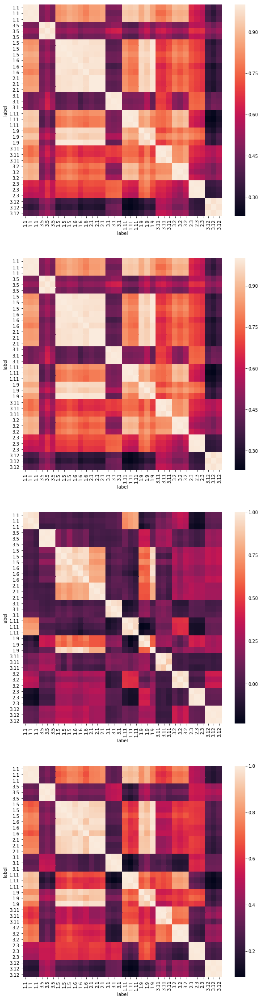

In [172]:
plt.figure(figsize=(10, 40))

plt.subplot(411)
corr = dfr.T.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)


plt.subplot(412)
corr = dfr_glo.T.corr()
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

plt.subplot(413)
corr = dfr_loc.T.corr()
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

plt.subplot(414)
corr = dfr_ang.T.corr()
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

plt.savefig("02_correlations.png")

### Correlation between features - same fiber

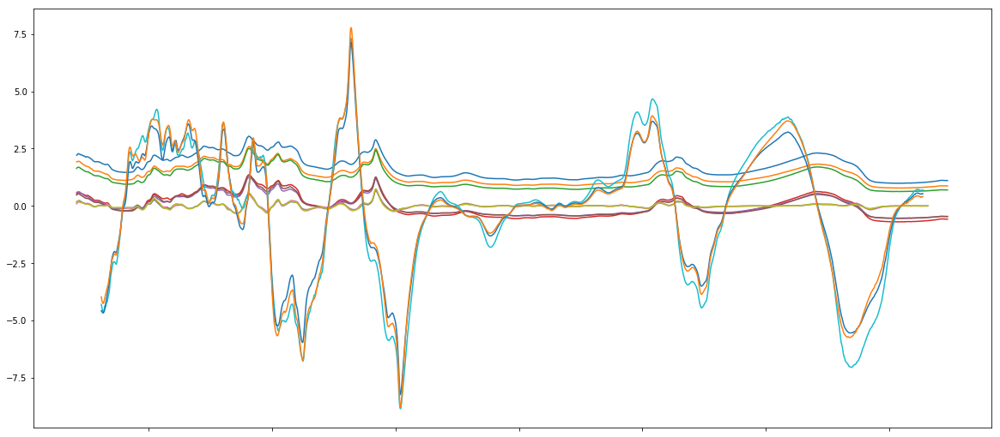

In [86]:
value = 2.3
df_val = pd.concat([dfr.loc[value], dfr_glo.loc[value], dfr_loc.loc[value], dfr_ang.loc[value]], axis=0)
df_val_s = standardize(df_val).astype(float)
df_val_n = normilize(df_val).astype(float)

df_val.T.plot(figsize=(20,9), legend=False)


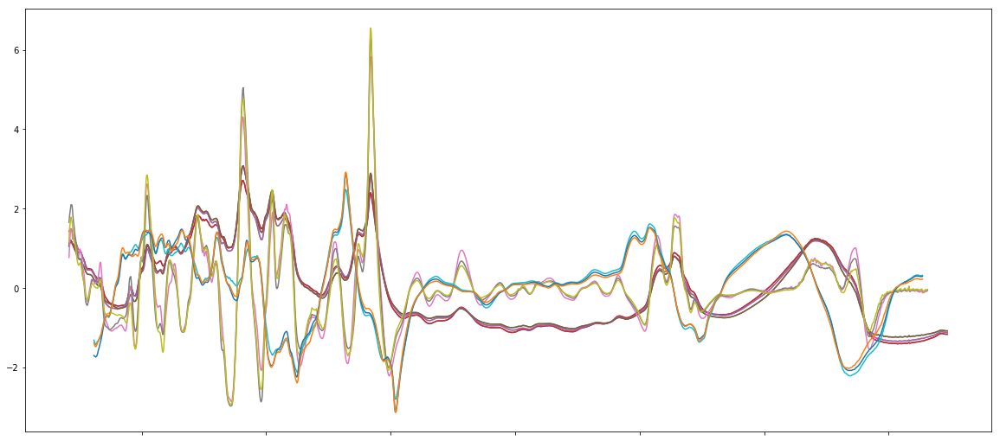

In [87]:
df_val_s.T.plot(figsize=(20,9), legend=False)

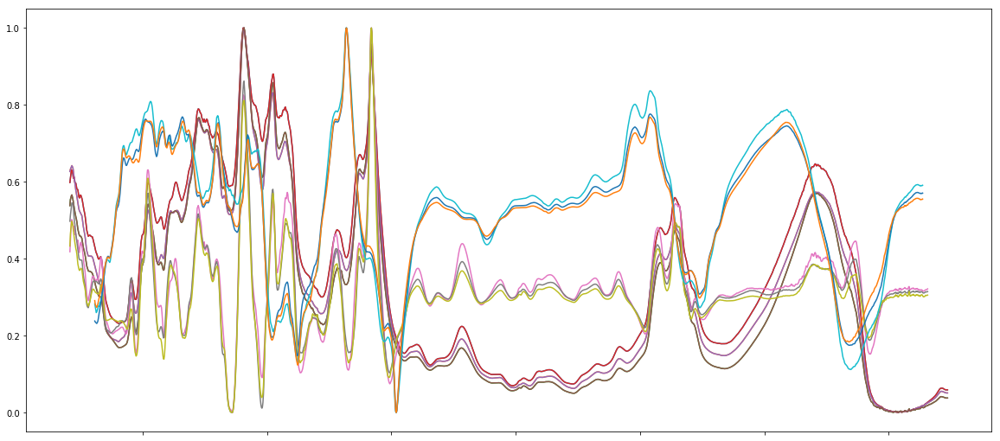

In [88]:
df_val_n.T.plot(figsize=(20,9), legend=False)

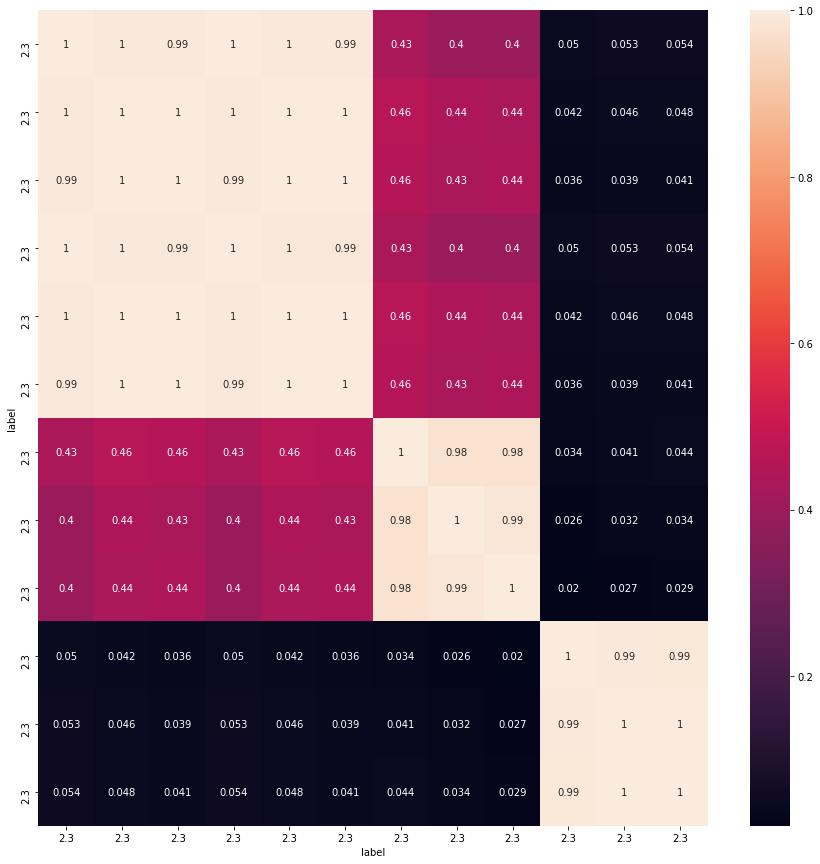

In [176]:
corr = df_val.T.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot = True,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.savefig('03_corr_between_features.png')

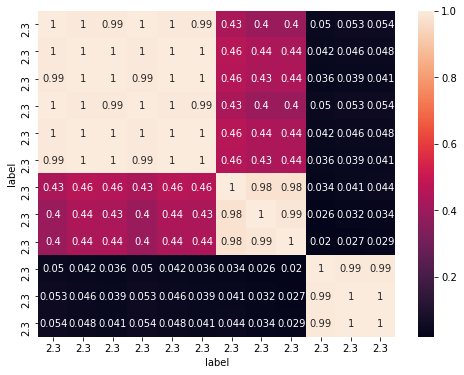

In [90]:
corrs = df_val_s.T.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corrs, annot=True,
            xticklabels=corrs.columns.values,
            yticklabels=corrs.columns.values)

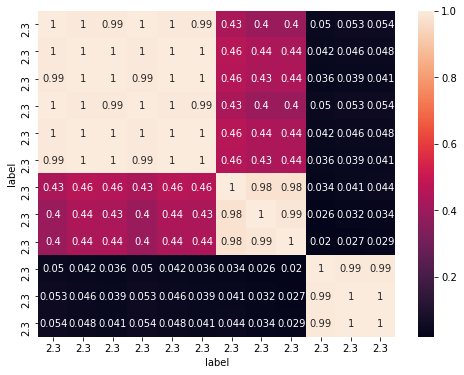

In [91]:
corrn = df_val_n.T.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corrs, annot=True,
            xticklabels=corrs.columns.values,
            yticklabels=corrs.columns.values)

In [92]:
corr

label,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3
label,,,,,,,,,,,,
2.3,1.000000,0.996079,0.992766,1.000000,0.996079,0.992766,0.430768,0.397775,0.397472,0.049792,0.053399,0.053992
2.3,0.996079,1.000000,0.996829,0.996079,1.000000,0.996829,0.460804,0.440745,0.436721,0.042465,0.046474,0.047815
2.3,0.992766,0.996829,1.000000,0.992766,0.996829,1.000000,0.458427,0.434360,0.438507,0.035836,0.039165,0.040598
2.3,1.000000,0.996079,0.992766,1.000000,0.996079,0.992766,0.430768,0.397775,0.397472,0.049792,0.053399,0.053992
2.3,0.996079,1.000000,0.996829,0.996079,1.000000,0.996829,0.460804,0.440745,0.436721,0.042465,0.046474,0.047815
2.3,0.992766,0.996829,1.000000,0.992766,0.996829,1.000000,0.458427,0.434360,0.438507,0.035836,0.039165,0.040598
2.3,0.430768,0.460804,0.458427,0.430768,0.460804,0.458427,1.000000,0.975950,0.976726,0.033831,0.041169,0.044005
2.3,0.397775,0.440745,0.434360,0.397775,0.440745,0.434360,0.975950,1.000000,0.987933,0.025512,0.032464,0.034206
2.3,0.397472,0.436721,0.438507,0.397472,0.436721,0.438507,0.976726,0.987933,1.000000,0.019969,0.027304,0.029477


In [93]:
corrs

label,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3,2.3
label,,,,,,,,,,,,
2.3,1.000000,0.996079,0.992766,1.000000,0.996079,0.992766,0.430768,0.397775,0.397472,0.049792,0.053399,0.053992
2.3,0.996079,1.000000,0.996829,0.996079,1.000000,0.996829,0.460804,0.440745,0.436721,0.042465,0.046474,0.047815
2.3,0.992766,0.996829,1.000000,0.992766,0.996829,1.000000,0.458427,0.434360,0.438507,0.035836,0.039165,0.040598
2.3,1.000000,0.996079,0.992766,1.000000,0.996079,0.992766,0.430768,0.397775,0.397472,0.049792,0.053399,0.053992
2.3,0.996079,1.000000,0.996829,0.996079,1.000000,0.996829,0.460804,0.440745,0.436721,0.042465,0.046474,0.047815
2.3,0.992766,0.996829,1.000000,0.992766,0.996829,1.000000,0.458427,0.434360,0.438507,0.035836,0.039165,0.040598
2.3,0.430768,0.460804,0.458427,0.430768,0.460804,0.458427,1.000000,0.975950,0.976726,0.033831,0.041169,0.044005
2.3,0.397775,0.440745,0.434360,0.397775,0.440745,0.434360,0.975950,1.000000,0.987933,0.025512,0.032464,0.034206
2.3,0.397472,0.436721,0.438507,0.397472,0.436721,0.438507,0.976726,0.987933,1.000000,0.019969,0.027304,0.029477
